# Project 4: Application of Dynamical Systems in studying Cosmological Models of Dark Energy 

In [1]:
using DynamicalSystems, Plots, PyCall, SymPy, LaTeXStrings, CairoMakie

In [2]:
sp = pyimport("sympy"); # Ignore Warning

In [3]:
x, y, z, mu = sp.symbols("x, y, z, mu")

(x, y, z, mu)

In [45]:
function solution_values2D(model,ic::Matrix,time,p=[]) # To find solution values in 2D cases
    n_ic = size(ic)[1]
    X = []
    Y = []
    for i in 1:n_ic
        curr_ode = CoupledODEs(model, ic[i,:], p)
        curr_pos, curr_time = trajectory(curr_ode,time)
        push!(X,curr_pos[:,1])
        push!(Y,curr_pos[:,2])
    end
    return X,Y
end

function solution_values3D(model,ic::Matrix,time,p=[]) # To find solution values in 3D cases
    n_ic = size(ic)[1]
    X = []
    Y = []
    Z = []
    for i in 1:n_ic
        curr_ode = CoupledODEs(model, ic[i,:], p)
        curr_pos, curr_time = trajectory(curr_ode,time)
        push!(X,curr_pos[:,1])
        push!(Y,curr_pos[:,2])
        push!(Z,curr_pos[:,3])
    end
    return X,Y,Z
end

function plot_phase_portrait2D(X,Y,fixed_points) # Plot 2D phase portraits

    Plots.plot(X,Y,label="",xlabel=L"x(t)~→",ylabel=L"y(t)~→",title=L"Phase~Portrait",gridlinewidth=2)
    Plots.scatter!(fixed_points, shape=:circle, malpha=0.9, msize=4, markerstrokewidth=2, markerstrokealpha=1, markerstrokecolor=:black, label="Fixed Points")
    
end

function animate_phase_portrait2D(X,Y,fixed_points,name::String,n_frames=12) # Animate 2D Phase Portraits
    
    anim = @animate for i ∈ 1:length(X[1])
        Plots.scatter(fixed_points, shape=:circle, malpha=0.9, msize=4, markerstrokewidth=2, markerstrokealpha=1, markerstrokecolor=:black, label="Fixed Points")
        for j in 1:length(X)
            Plots.plot!((X[j][1:i],Y[j][1:i]), label="", xlabel=L"x(t)~→",ylabel=L"y(t)~→",title=L"Phase~Portrait",gridlinewidth=2)
        end
    end
    gif(anim, "$name.gif", fps = n_frames)
end

function quiver_values(X,Y) # Returns quiver (arrow) values used to generate the vector field plot
    u_quiver = [X[i][2:end] .- X[i][1:end-1] for i in 1:length(X)]
    v_quiver = [Y[i][2:end] .- Y[i][1:end-1] for i in 1:length(Y)]
    return u_quiver, v_quiver
end;

## $\Lambda \text{CDM}$ Model

The governing equations of motion are:
$$ x' = -x(1-x+3y) \\ y' = y(3+x-3y) $$

where,
$$ x \equiv \Omega_r = \frac{\rho_r}{3H^2} \\ y \equiv \Omega_{\Lambda} = \frac{\Lambda}{3H^2} \\ \Rightarrow \Omega_m = 1-x-y$$

Here, $\Omega$ represents the dimensionless energy density of the respective subscript $\text{(radiation, dark matter, ordinary matter)}$ and $H$ is the Hubble's parameter

Using equations of dynamics and conservation laws, the phase space for the $\Lambda\text{CDM}$ model is represented as:
$$ \Psi_{\Lambda} = \{ (x,y): x+y \leq 1,~0\leq x\leq 1,~0\leq y\leq 1 \} $$

which is nothing but a triangular region enclosed by the coordinate axes and the line $x+y=1$

First, we try to find the critical points for the system as follows:

In [5]:
eq1_ΛCDM = sp.Eq(-x*(1-x+3*y),0)
eq2_ΛCDM = sp.Eq(y*(3+x-3*y),0)
solution_ΛCDM = convert(Vector{Tuple{Sym,Sym}},sp.solve([eq1_ΛCDM, eq2_ΛCDM],(x, y))) # Ignore Warning

sys:1: SymPyDeprecationWarning: 

non-Expr objects in a Matrix is deprecated. Matrix represents
a mathematical matrix. To represent a container of non-numeric
entities, Use a list of lists, TableForm, NumPy array, or some
other data structure instead.

See https://docs.sympy.org/latest/explanation/active-deprecations.html#deprecated-non-expr-in-matrix
for details.

This has been deprecated since SymPy version 1.9. It
will be removed in a future version of SymPy.



3-element Vector{Tuple{Sym, Sym}}:
 (0, 0)
 (0, 1)
 (1, 0)

We can also analyze the behaviour of the critical points by linearization of the equations about the concerned point. The eigenvalues of the Jacobian matrix calculated at the concerned point determines the nature of the point (upto the linearized term)

In [6]:
xmat_ΛCDM = sp.Matrix([-x*(1-x+3*y),y*(3+x-3*y)])
ymat_ΛCDM = sp.Matrix([x,y])
jbmat_ΛCDM = xmat_ΛCDM.jacobian(ymat_ΛCDM) # Jacobian for the ΛCDM Model

2×2 Matrix{Sym}:
 2*x - 3*y - 1         -3*x
             y  x - 6*y + 3

Let us analyze the nature for one of the points, say, $(0,1)$

In [7]:
subs_ΛCDM = sp.simplify(sp.Subs(jbmat_ΛCDM,[x,y],[0,1]))
eigenvals_ΛCDM = [k for k in keys(subs_ΛCDM.eigenvals())]

2-element Vector{Sym}:
 -3
 -4

As can be seen clearly, both eigenvalues were real and negative which implies that $(0,1)$ is a $\text{sink (attractor)}$!

Similar analysis can be done for the rest of the points to arrive at the following conclusion:
 
<center>
<table>
    <tr>
        <td>Critical Point</td>
        <td>Nature</td>
    </tr>
    <tr>
        <td>(0,0)</td>
        <td>Saddle</td>
    </tr>
    <tr>
        <td>(0,1)</td>
        <td>Sink</td>
    </tr>
    <tr>
        <td>(1,0)</td>
        <td>Source</td>
    </tr>
</table>
</center>

Now we perform the full calculation using numerical integration:

In [8]:
function ΛCDM_Model(du, u, p, t) # returns the differential equations of the ΛCDM model
    
    du[1] = -u[1]*(1-u[1]+3*u[2])
    du[2] = u[2]*(3+u[1]-3*u[2])
    
    return nothing 
end;

ΛCDM_Model (generic function with 1 method)

In [9]:
total_time_ΛCDM = 100 # Evolution time
sampling_time_ΛCDM = 0.1
time_range = collect(range(0,total_time_ΛCDM,step=sampling_time_ΛCDM));

### Random Initial Conditions

We generate phase portraits using random initial conditions such that they obey the constraints defined in the phase space of the model -

In [11]:
#Random.seed!(10) # Uncomment if want to use seed
n_ΛCDM = 50 # number of initial conditions
x_ic_rand_ΛCDM = rand(n_ΛCDM)
y_ic_rand_ΛCDM = rand(n_ΛCDM) .* (1 .- x_ic_rand_ΛCDM)
u_ic_rand_ΛCDM = hcat(x_ic_rand_ΛCDM,y_ic_rand_ΛCDM)

# Solution
x_sol_rand_ΛCDM,y_sol_rand_ΛCDM = solution_values2D(ΛCDM_Model,u_ic_rand_ΛCDM,total_time_ΛCDM);

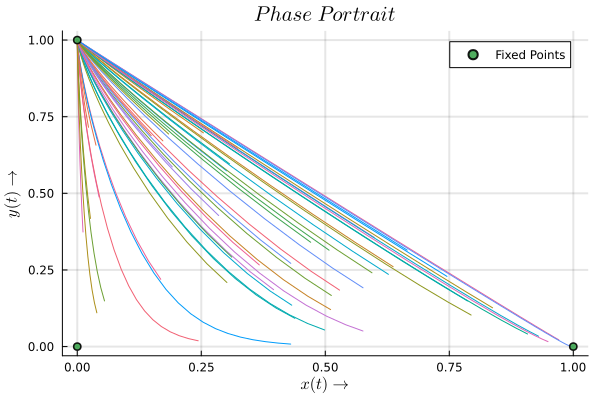

In [12]:
plot_phase_portrait2D(x_sol_rand_ΛCDM,y_sol_rand_ΛCDM,solution_ΛCDM) # Phase Portrait

┌ Info: Saved animation to c:\Users\Computing\Documents\PYL800 Proj 4\ΛCDM_1.gif
└ @ Plots C:\Users\Computing\.julia\packages\Plots\esM5q\src\animation.jl:156


Plots.AnimatedGif("c:\\Users\\Computing\\Documents\\PYL800 Proj 4\\ΛCDM_1.gif")
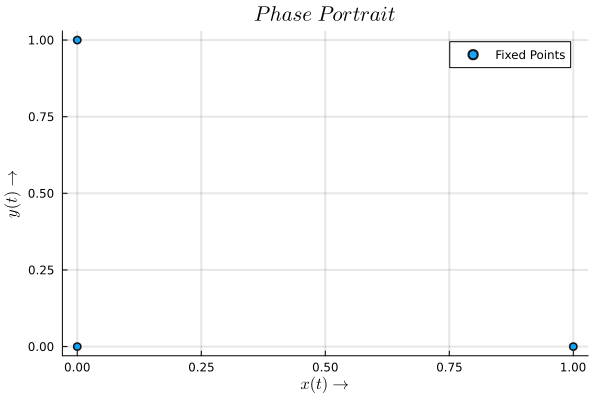

In [13]:
animate_phase_portrait2D(x_sol_rand_ΛCDM,y_sol_rand_ΛCDM,solution_ΛCDM,"ΛCDM_1") # Animated Phase Portrait

### Specific Initial Conditions

We do the same analysis, however this time, with specific initial conditions such that all starting positions are randomly distributed across the $X$ axis, however the $Y$ coordinate is very close to $0$.

In [14]:
x_ic_spec_ΛCDM = rand(n_ΛCDM)
y_ic_spec_ΛCDM = rand(n_ΛCDM) .* x_ic_spec_ΛCDM/200
u_ic_spec_ΛCDM = hcat(x_ic_spec_ΛCDM,y_ic_spec_ΛCDM);

# Solution
x_sol_spec_ΛCDM,y_sol_spec_ΛCDM = solution_values2D(ΛCDM_Model,u_ic_spec_ΛCDM,total_time_ΛCDM);

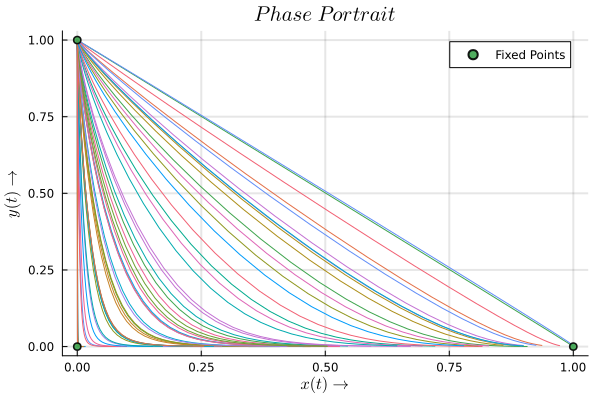

In [15]:
plot_phase_portrait2D(x_sol_spec_ΛCDM,y_sol_spec_ΛCDM,solution_ΛCDM) # Phase Portrait

┌ Info: Saved animation to c:\Users\Computing\Documents\PYL800 Proj 4\ΛCDM_2.gif
└ @ Plots C:\Users\Computing\.julia\packages\Plots\esM5q\src\animation.jl:156


Plots.AnimatedGif("c:\\Users\\Computing\\Documents\\PYL800 Proj 4\\ΛCDM_2.gif")
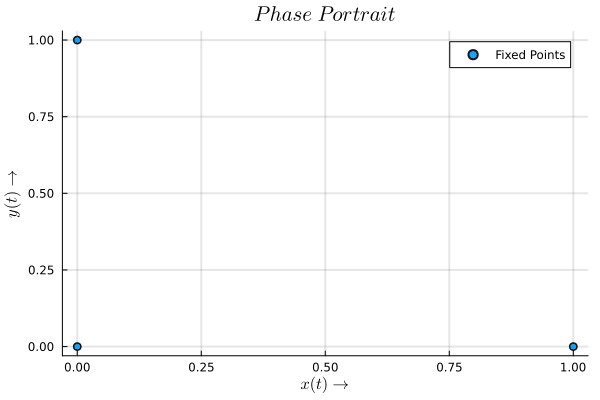

In [16]:
animate_phase_portrait2D(x_sol_spec_ΛCDM,y_sol_spec_ΛCDM,solution_ΛCDM,"ΛCDM_2") # Animated Phase Portrait

In [17]:
uq_spec_ΛCDM, vq_spec_ΛCDM = quiver_values(x_sol_spec_ΛCDM,y_sol_spec_ΛCDM);

Checking the setup:

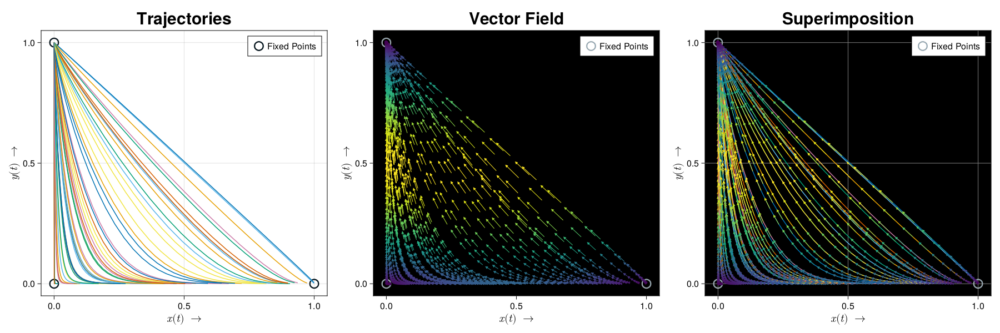

In [18]:
f1 = Figure(resolution = (1800, 600))

# Trajectories
Axis(f1[1, 1], backgroundcolor = "white", title = "Trajectories", titlesize=30, xlabel=L"x(t)~→", xlabelsize=20, ylabel=L"y(t)~→", ylabelsize=20)
CairoMakie.scatter!(solution_ΛCDM, marker='○', markersize=22, strokewidth=1, strokecolor="black", label="Fixed Points")
for i in 1:length(x_sol_spec_ΛCDM) 
    lines!(x_sol_spec_ΛCDM[i],y_sol_spec_ΛCDM[i]) 
end
axislegend()

# Corresponding Vector Field (using the above trajectories)
Axis(f1[1,2], backgroundcolor = "black", title = "Vector Field", titlesize=30, xlabel=L"x(t)~→", xlabelsize=20, ylabel=L"y(t)~→", ylabelsize=20)
CairoMakie.scatter!(solution_ΛCDM, marker='○', markersize=22, strokewidth=1, strokecolor="grey70", label="Fixed Points")
for i in 1:length(x_sol_spec_ΛCDM)
    strength = vec(sqrt.(uq_spec_ΛCDM[i] .^ 2 .+ vq_spec_ΛCDM[i] .^ 2))
    arrows!(x_sol_spec_ΛCDM[i],y_sol_spec_ΛCDM[i], uq_spec_ΛCDM[i], vq_spec_ΛCDM[i], arrowsize = 7, lengthscale = 0.5, arrowcolor = strength, linecolor = strength)
end
axislegend()

# Superimposition
Axis(f1[1,3], backgroundcolor = "black", xgridcolor="grey50", ygridcolor="grey50", title = "Superimposition", titlesize=30, xlabel=L"x(t)~→"
, xlabelsize=20, ylabel=L"y(t)~→", ylabelsize=20)
CairoMakie.scatter!(solution_ΛCDM, marker='○', markersize=22, strokewidth=1, strokecolor="grey70", label="Fixed Points")
for i in 1:length(x_sol_spec_ΛCDM)
    strength = vec(sqrt.(uq_spec_ΛCDM[i] .^ 2 .+ vq_spec_ΛCDM[i] .^ 2))
    lines!(x_sol_spec_ΛCDM[i],y_sol_spec_ΛCDM[i])
    arrows!(x_sol_spec_ΛCDM[i],y_sol_spec_ΛCDM[i], uq_spec_ΛCDM[i], vq_spec_ΛCDM[i], arrowsize = 7, lengthscale = 0.5, arrowcolor = strength, linecolor = strength)
end
axislegend()

f1

### Random Initial Conditions for Vector Field

Now we finally do the exercise with randomly distributed points that are confined to regions near $X=1$ and $Y=0$ so that we are able to get a good vector field plot

In [19]:
x_ic_randvf1_ΛCDM = 0.95 .+ 0.05*rand(65) # 0.95 ≤ x ≤ 1
y_ic_randvf1_ΛCDM = rand(65) # 0 ≤ y ≤ 1
u_ic_randvf1_ΛCDM = hcat(x_ic_randvf1_ΛCDM, y_ic_randvf1_ΛCDM)
x_ic_randvf2_ΛCDM = rand(65) # 0 ≤ x ≤ 1
y_ic_randvf2_ΛCDM = 0.05*rand(65) # 0 ≤ y ≤ 0.05
u_ic_randvf2_ΛCDM = hcat(x_ic_randvf2_ΛCDM, y_ic_randvf2_ΛCDM)
u_ic_randvf_ΛCDM = vcat(u_ic_randvf1_ΛCDM,u_ic_randvf2_ΛCDM)


x_sol_randvf_ΛCDM,y_sol_randvf_ΛCDM = solution_values2D(ΛCDM_Model,u_ic_randvf_ΛCDM,total_time_ΛCDM);

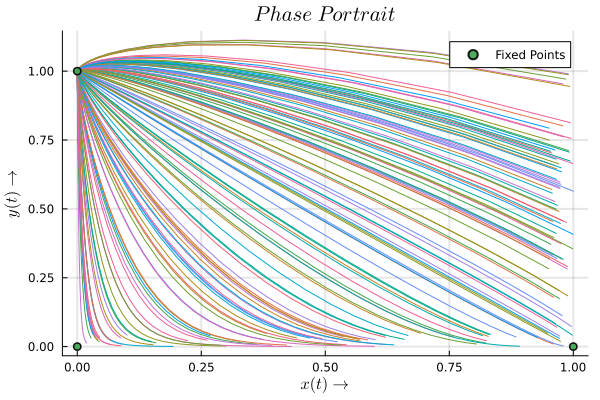

In [20]:
plot_phase_portrait2D(x_sol_randvf_ΛCDM,y_sol_randvf_ΛCDM,solution_ΛCDM) # Phase Portrait

┌ Info: Saved animation to c:\Users\Computing\Documents\PYL800 Proj 4\ΛCDM_3.gif
└ @ Plots C:\Users\Computing\.julia\packages\Plots\esM5q\src\animation.jl:156


Plots.AnimatedGif("c:\\Users\\Computing\\Documents\\PYL800 Proj 4\\ΛCDM_3.gif")
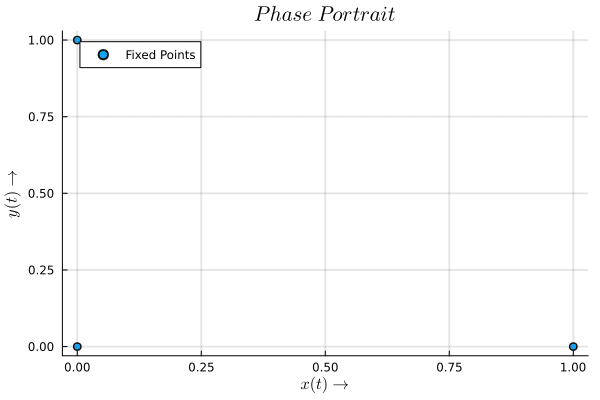

In [21]:
animate_phase_portrait2D(x_sol_randvf_ΛCDM,y_sol_randvf_ΛCDM,solution_ΛCDM,"ΛCDM_3") # Animated Phase Portrait

In [22]:
uq_randvf_ΛCDM, vq_randvf_ΛCDM = quiver_values(x_sol_randvf_ΛCDM,y_sol_randvf_ΛCDM);

Bringing it all together:

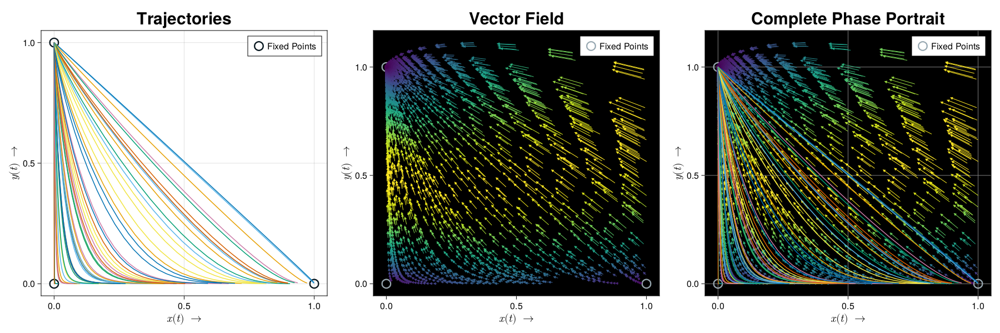

In [23]:
f2 = Figure(resolution = (1800, 600))

# Trajectories
Axis(f2[1, 1], backgroundcolor = "white", title = "Trajectories", titlesize=30, xlabel=L"x(t)~→", xlabelsize=20, ylabel=L"y(t)~→", ylabelsize=20)
CairoMakie.scatter!(solution_ΛCDM, marker='○', markersize=22, strokewidth=1, strokecolor="black", label="Fixed Points")
for i in 1:length(x_sol_spec_ΛCDM)
    lines!(x_sol_spec_ΛCDM[i],y_sol_spec_ΛCDM[i])
end
axislegend()

# Generalized Vector Field (using random initial conditions)
Axis(f2[1, 2], backgroundcolor = "black", title = "Vector Field", titlesize=30, xlabel=L"x(t)~→", xlabelsize=20, ylabel=L"y(t)~→", ylabelsize=20)
CairoMakie.scatter!(solution_ΛCDM, marker='○', markersize=22, strokewidth=1, strokecolor="grey70", label="Fixed Points")
for i in 1:length(uq_randvf_ΛCDM)
    xs = x_sol_randvf_ΛCDM[i]
    ys = y_sol_randvf_ΛCDM[i]
    us = uq_randvf_ΛCDM[i]
    vs = vq_randvf_ΛCDM[i]
    strength = vec(sqrt.(us .^ 2 .+ vs .^ 2))

    arrows!(xs, ys, us, vs, arrowsize = 7, lengthscale = 0.4, arrowcolor = strength, linecolor = strength)
end
axislegend()

# Complete Phase Portrait
Axis(f2[1, 3], backgroundcolor = "black", xgridcolor="grey50", ygridcolor="grey50", title = "Complete Phase Portrait", titlesize=30,
 xlabel=L"x(t)~→", xlabelsize=20, ylabel=L"y(t)~→", ylabelsize=20)
CairoMakie.scatter!(solution_ΛCDM, marker='○', markersize=22, strokewidth=1, strokecolor="grey70", label="Fixed Points")
for i in 1:length(uq_randvf_ΛCDM)
    xs = x_sol_randvf_ΛCDM[i]
    ys = y_sol_randvf_ΛCDM[i]
    us = uq_randvf_ΛCDM[i]
    vs = vq_randvf_ΛCDM[i]
    strength = vec(sqrt.(us .^ 2 .+ vs .^ 2))

    arrows!(xs, ys, us, vs, arrowsize = 7, lengthscale = 0.4, arrowcolor = strength, linecolor = strength)
end
for i in 1:length(x_sol_spec_ΛCDM)
    lines!(x_sol_spec_ΛCDM[i],y_sol_spec_ΛCDM[i])
end
axislegend()

f2

## Scalar Field Model of Dark Energy

### $\text{I.}~V(X) = e^{\mu X}$

The discussion for $V(X) = e^{-\mu X}$ is the same since it involves just reversing the sign of $\mu$

The equations governing the dynamics here are:
$$ x' = -\frac{3x}{2}(1-x^2+y^2) - \sqrt{\frac{3}{2}}\mu y^2 \\ y' = \frac{3y}{2}(1+x^2-y^2) + \sqrt{\frac{3}{2}}\mu xy \\ z'= 0 \Rightarrow z = \mu~ (\text{constant}) $$

The concerned phase space is:
$$ \Psi_X = \{ (x,y) : 0 \leq x^2 + y^2 \leq 1, |x| \leq 1, y \geq 0 \} $$ 
which is an upper semi-circular disk.

Solving the system symbolically:

In [24]:
symbeq1_exp = sp.Eq(-1.5*x*(1-x^2+y^2)-sp.sqrt(1.5)*mu*y^2,0)
symbeq2_exp = sp.Eq(1.5*y*(1+x^2-y^2)+sp.sqrt(1.5)*mu*x*y,0)
symbeq3_exp = sp.Eq(z,mu)
symbsoln_exp = convert(Vector{Tuple{Sym,Sym,Sym}},sp.solve([symbeq1_exp, symbeq2_exp, symbeq3_exp],(x, y, z))) # Ignore warning

7-element Vector{Tuple{Sym, Sym, Sym}}:
 (-1.00000000000000, 0.0, mu)
 (0.0, 0.0, mu)
 (1.00000000000000, 0.0, mu)
 (-1.22474487139159/mu, -1.22474487139159/mu, mu)
 (-1.22474487139159/mu, 1.22474487139159/mu, mu)
 (-0.408248290463863*mu, -sqrt(1.0 - 0.166666666666667*mu^2), mu)
 (-0.408248290463863*mu, sqrt(1.0 - 0.166666666666667*mu^2), mu)

Choosing a value for $\mu$ and substituting to get the final critical points:

In [25]:
mu_val_exp = 1
soleq1_exp = subs(sp.Eq(-1.5*x*(1-x^2+y^2)-sp.sqrt(1.5)*mu*y^2,0),mu,mu_val_exp)
soleq2_exp = subs(sp.Eq(1.5*y*(1+x^2-y^2)+sp.sqrt(1.5)*mu*x*y,0),mu,mu_val_exp)
soleq3_exp = subs(sp.Eq(z,mu),mu,mu_val_exp)
numsoln_exp = sp.solve([soleq1_exp, soleq2_exp, soleq3_exp],(x, y, z))

7-element Vector{Tuple{Sym, Sym, Sym}}:
 (-1.22474487139159, -1.22474487139159, 1.00000000000000)
 (-1.22474487139159, 1.22474487139159, 1.00000000000000)
 (-1.00000000000000, 0.0, 1.00000000000000)
 (-0.408248290463863, -0.912870929175277, 1.00000000000000)
 (-0.408248290463863, 0.912870929175277, 1.00000000000000)
 (0.0, 0.0, 1.00000000000000)
 (1.00000000000000, 0.0, 1.00000000000000)

We can again find the Jacobian as:

In [26]:
xmat_exp = sp.Matrix([-1.5*x*(1-x^2+y^2)-sp.sqrt(1.5)*mu_val_exp*y^2,1.5*y*(1+x^2-y^2)+sp.sqrt(1.5)*mu_val_exp*x*y])
ymat_exp = sp.Matrix([x,y])
jbmat_exp = xmat_exp.jacobian(ymat_exp) # Jacobian for the Exponential Potential Model

2×2 Matrix{Sym}:
      4.5*x^2 - 1.5*y^2 - 1.5                 -3.0*x*y - 2.44948974278318*y
 3.0*x*y + 1.22474487139159*y  1.5*x^2 + 1.22474487139159*x - 4.5*y^2 + 1.5

And again check for stability for all the critical points!

In [27]:
subs_exp = sp.simplify(sp.Subs(jbmat_exp,[x,y],[1,0]))
eigenvals_exp = [k for k in keys(subs_exp.eigenvals())]

2-element Vector{Sym}:
 4.224744871391589384757025982253253459930419921875000000000000000000000000000
 3.000000000000000000000000000000000000000000000000000000000000000000000000000

The above shows that $(1,0)$ is a source!

A careful analysis will give us the following:

1. $(0,0)$ is always a $\text{saddle}$
2. $(1,0)$ is a:
    - $\text{Saddle}$ if $\mu < -\sqrt{6}$
    - $\text{Source}$ if $\mu > -\sqrt{6}$
3. $(-1,0)$ is a:
    - $\text{Source}$ if $\mu < \sqrt{6}$
    - $\text{Saddle}$ if $\mu > \sqrt{6}$
4. $(-\sqrt{\frac{3}{2}}\frac{1}{\mu},\pm\sqrt{\frac{3}{2}}\frac{1}{\mu})$ exists only when $\mu \neq 0$ and is a
    - $\text{Sink}$ for $\mu \in \big[-\sqrt{\frac{24}{7}},-\sqrt{3}\big) \cup \big(\sqrt{3},\sqrt{\frac{24}{7}}\big] $
    - $\text{Saddle}$ for $\mu \in \big(-\sqrt{3}, \sqrt{3}\big) - \{0\} $
    - $\text{Stable Spiral}$, otherwise
5. $(-\frac{\mu}{\sqrt{6}},\pm\sqrt{1-\frac{\mu^2}{6}})$ exists only when $\mu \in \big(-\sqrt{6},\sqrt{6}\big)$ and is a
    - $\text{Saddle}$ for $\mu \in \big(-\sqrt{6},-\sqrt{3}\big) \cup \big(\sqrt{3},\sqrt{6}\big) $
    - $\text{Sink}$ for $\mu \in \big(-\sqrt{3}, \sqrt{3}\big)$

In [28]:
function scalar_field_exp_pot_model(du, u, p, t) # Defining the exponential potential model

    mu = p
    du[1] = -1.5*u[1]*(1 - u[1]^2 + u[2]^2) - sqrt(1.5)*mu*u[2]^2
    du[2] = 1.5*u[2]*(1 + u[1]^2 - u[2]^2) + sqrt(1.5)*mu*u[1]*u[2]
    
    return nothing 
end;

scalar_field_exp_pot_model (generic function with 1 method)

In [29]:
n_exp = 30 # Number of initial conditions
time_exp = 20 # Evolution Time

# Initial conditions are chosen such that they fall within the phase space
x_ic_rand_exp = -1 .+ 2*rand(n_exp) # Initial value of x ∈ (-1,1)
y_ic_rand_exp = rand(n_exp) .* sqrt.(1 .- x_ic_rand_exp.^2) # Initial value of y ∈ (0,√(1-x^2))
u_ic_rand_exp = hcat(x_ic_rand_exp,y_ic_rand_exp);

In [30]:
x_sol_rand_exp, y_sol_rand_exp = solution_values2D(scalar_field_exp_pot_model,u_ic_rand_exp,time_exp,mu_val_exp) # Solving the system
z_sol_exp = mu_val_exp*ones(length(x_sol_rand_exp[1]));

After solving the system, we make an interactive phase portrait using $\text{plotlyjs}$ which allows us to zoom, rotate and view the portrait in a number of different configurations!

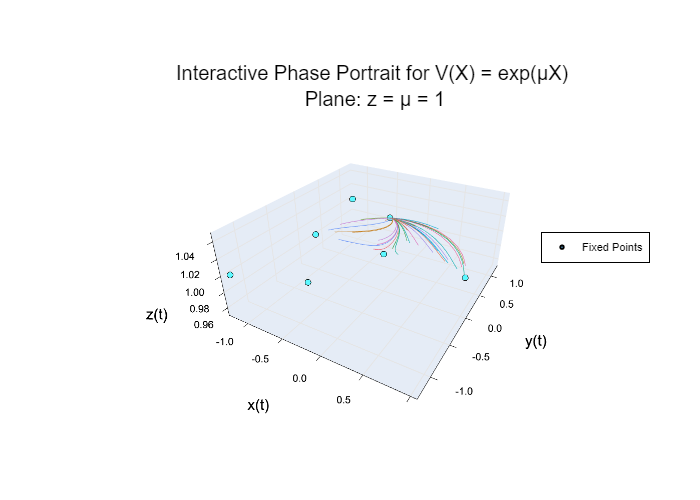

In [31]:
plotlyjs()
Plots.scatter(numsoln_exp, shape=:circle, malpha=0.6, msize=1.7, markerstrokewidth=2, markerstrokealpha=1, markerstrokecolor=:black, label="Fixed Points", legend=:right)
Plots.plot!(x_sol_rand_exp,y_sol_rand_exp,z_sol_exp,label="",gridlinewidth=2, zlims=(mu_val_exp-0.05,mu_val_exp+0.05))
Plots.xlabel!("x(t)")
Plots.ylabel!("y(t)")
Plots.zlabel!("z(t)")
Plots.title!("Interactive Phase Portrait for V(X) = exp(μX) <br>Plane: z = μ = $mu_val_exp")

An animation is also made to visualize the evolution from initial conditions towards one of the fixed points:

sys:1: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


┌ Info: Saved animation to c:\Users\Computing\Documents\PYL800 Proj 4\Exponential Potential Model.gif
└ @ Plots C:\Users\Computing\.julia\packages\Plots\esM5q\src\animation.jl:156


Plots.AnimatedGif("c:\\Users\\Computing\\Documents\\PYL800 Proj 4\\Exponential Potential Model.gif")
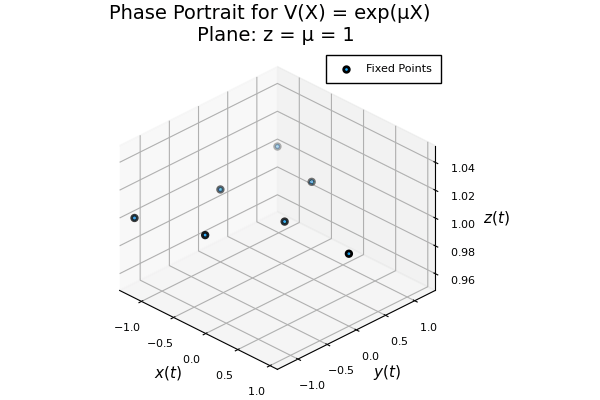

In [32]:
pyplot()
anim = @animate for i ∈ 1:length(x_sol_rand_exp[1])
    Plots.scatter(numsoln_exp, shape=:circle, malpha=0.9, msize=4, markerstrokewidth=2, markerstrokealpha=1, markerstrokecolor=:black, label="Fixed Points")
    for j in 1:length(x_sol_rand_exp)
        Plots.plot!((x_sol_rand_exp[j][1:i],y_sol_rand_exp[j][1:i],z_sol_exp[1:i]), label="", xlabel=L"x(t)",ylabel=L"y(t)",zlabel=L"z(t)",zlims=(mu_val_exp-0.05,mu_val_exp+0.05),title=string("Phase Portrait for V(X) = exp(μX) \n Plane: z = μ = ",mu_val_exp),gridlinewidth=2, cam=(45,30))
    end
end
gif(anim, "Exponential Potential Model.gif", fps = 12)

### $\text{II}.~ V(X) = V_0\cosh{\mu X}$

Now, a similar analysis is done for the Hyperbolic Cosine self-interaction potential $V(X) = V_0\cosh{\mu X}$

The concerned equations of motion are:
$$ x' = -\frac{3x}{2}(1-x^2+y^2) - \sqrt{\frac{3}{2}} y^2 z \\ y' = \frac{3y}{2}(1+x^2-y^2) + \sqrt{\frac{3}{2}} xyz \\ z'= \sqrt{6}x(\mu^2 - z^2) $$

The corresponding phase space is:
$$ \Psi_X = \{ (x,y,z) : 0 \leq x^2 + y^2 \leq 1, |x| \leq 1, y \geq 0, |z| < \mu \} $$ 
which is a semi-cylinder.

In [33]:
symbeq1_cosh = sp.Eq(-1.5*x*(1-x^2+y^2)-sp.sqrt(1.5)*y^2*z,0)
symbeq2_cosh = sp.Eq(1.5*y*(1+x^2-y^2)+sp.sqrt(1.5)*x*y*z,0)
symbeq3_cosh = sp.Eq(sp.sqrt(6)*x*(mu^2 - z^2),0)
symbsoln_cosh = convert(Vector{Tuple{Sym,Sym,Sym}},sp.solve([symbeq1_cosh, symbeq2_cosh, symbeq3_cosh],(x, y, z))) # Ignore Warning

sys:1: SymPyDeprecationWarning: 

non-Expr objects in a Matrix is deprecated. Matrix represents
a mathematical matrix. To represent a container of non-numeric
entities, Use a list of lists, TableForm, NumPy array, or some
other data structure instead.

See https://docs.sympy.org/latest/explanation/active-deprecations.html#deprecated-non-expr-in-matrix
for details.

This has been deprecated since SymPy version 1.9. It
will be removed in a future version of SymPy.



7-element Vector{Tuple{Sym, Sym, Sym}}:
 (-1.00000000000000, 0.0, -mu)
 (-1.00000000000000, 0.0, mu)
 (0.0, -1.00000000000000, 0.0)
 (0.0, 0.0, z)
 (0.0, 1.00000000000000, 0.0)
 (1.00000000000000, 0.0, -mu)
 (1.00000000000000, 0.0, mu)

Solving the system symbolically does not give us all the required critical points and moreover we get a point which is not present in our phase space!

In [34]:
mu_val_cosh = 2
soleq1_cosh = subs(sp.Eq(-1.5*x*(1-x^2+y^2)-sp.sqrt(1.5)*z*y^2,0),mu,mu_val_cosh)
soleq2_cosh = subs(sp.Eq(1.5*y*(1+x^2-y^2)+sp.sqrt(1.5)*z*x*y,0),mu,mu_val_cosh)
soleq3_cosh = subs(sp.Eq(sp.sqrt(6)*x*(mu^2 - z^2),0),mu,mu_val_cosh)
numsoln_cosh = sp.solve([soleq1_cosh, soleq2_cosh, soleq3_cosh],(x, y, z))

7-element Vector{Tuple{Sym, Sym, Sym}}:
 (-1.00000000000000, 0.0, -2.00000000000000)
 (-1.00000000000000, 0.0, 2.00000000000000)
 (0.0, -1.00000000000000, 0.0)
 (0.0, 0.0, z)
 (0.0, 1.00000000000000, 0.0)
 (1.00000000000000, 0.0, -2.00000000000000)
 (1.00000000000000, 0.0, 2.00000000000000)

Therefore, we discard the point which is not present in our phase space as well as the point $(0,0,z)$ which is the whole of $z$ axis (since it can be handled separately):

In [35]:
fixed_points_cosh = Vector{Tuple{Float64,Float64,Float64}}(undef,0)
for i in 1:length(numsoln_cosh)
    if numsoln_cosh[i][3]!=z
        if numsoln_cosh[i][2]>=0
            push!(fixed_points_cosh,convert.(Float64,numsoln_cosh[i]))
        end
    end
end
fixed_points_cosh

5-element Vector{Tuple{Float64, Float64, Float64}}:
 (-1.0, 0.0, -2.0)
 (-1.0, 0.0, 2.0)
 (0.0, 1.0, 0.0)
 (1.0, 0.0, -2.0)
 (1.0, 0.0, 2.0)

Now, we add the remaining fixed points which were missed by the symbolic calculator:

In [36]:
function additional_fixed_points_cosh(curr_fixed_points,mu_val)
    if mu_val^2 >= 1.5
        push!(curr_fixed_points,(sqrt(1.5)/mu_val,sqrt(1.5)/mu_val,-mu_val))
        push!(curr_fixed_points,(-sqrt(1.5)/mu_val,sqrt(1.5)/mu_val,mu_val))
    end

    if mu_val^2 <= 6
        push!(curr_fixed_points,(mu_val/sqrt(6),sqrt(1-(mu_val^2 /6)),-mu_val))
        push!(curr_fixed_points,(-mu_val/sqrt(6),sqrt(1-(mu_val^2 /6)),mu_val))
    end
end;

additional_fixed_points_cosh (generic function with 1 method)

In [37]:
fixed_points_cosh = additional_fixed_points_cosh(fixed_points_cosh,mu_val_cosh)

9-element Vector{Tuple{Float64, Float64, Float64}}:
 (-1.0, 0.0, -2.0)
 (-1.0, 0.0, 2.0)
 (0.0, 1.0, 0.0)
 (1.0, 0.0, -2.0)
 (1.0, 0.0, 2.0)
 (0.6123724356957945, 0.6123724356957945, -2.0)
 (-0.6123724356957945, 0.6123724356957945, 2.0)
 (0.8164965809277261, 0.5773502691896258, -2.0)
 (-0.8164965809277261, 0.5773502691896258, 2.0)

Now, we analyse the stability of the fixed points:

In [38]:
xmat_cosh = sp.Matrix([-1.5*x*(1-x^2+y^2)-sp.sqrt(1.5)*z*y^2,1.5*y*(1+x^2-y^2)+sp.sqrt(1.5)*z*x*y,sp.sqrt(6)*x*(mu_val_cosh^2 - z^2)])
ymat_cosh = sp.Matrix([x,y,z])
jbmat_cosh = xmat_cosh.jacobian(ymat_cosh) # Jacobian for the Hyperbolic Cosine Potential Model

3×3 Matrix{Sym}:
        4.5*x^2 - 1.5*y^2 - 1.5  …  -1.22474487139159*y^2
 3.0*x*y + 1.22474487139159*y*z      1.22474487139159*x*y
              sqrt(6)*(4 - z^2)            -2*sqrt(6)*x*z

In [39]:
subs_cosh = sp.simplify(sp.Subs(jbmat_cosh,[x,y,z],[-1,0,-2]))
eigenvals_cosh = [k for k in keys(subs_cosh.eigenvals())]

3-element Vector{Sym}:
 -9.797958971132712392789136298823631215277019467821948094427464588662690658794
  5.449489742783177881335632264381274580955505371093750000000000000000000000000
  3.000000000000000000000000000000000000000000000000000000000000000000000000000

The above example point $(-1,0,-2)$ is clearly a saddle!

Moreover, the final complete analysis gives us:

1. $(0,0,z)$ is always a $\text{saddle}$
2. $(0,1,0)$ is a:
    - $\text{Sink}$ if $\mu \in \big[-\frac{\sqrt{3}}{2},\frac{\sqrt{3}}{2} \big]$
    - $\text{Stable Spiral}$ if $\mu \in \big( -\infty,-\frac{\sqrt{3}}{2} \big) \cup \big( \frac{\sqrt{3}}{2}, \infty \big)$
3. $(\pm 1,0,\mu)$ and $(\pm 1,0,-\mu)$ are all a:
    - $\text{Source}$ if $ -\sqrt{6} \leq \mu \leq 0$
    - $\text{Saddle}$, otherwise
4. $(\pm\sqrt{\frac{3}{2}}\frac{1}{\mu},\sqrt{\frac{3}{2}}\frac{1}{\mu},\mp \mu)$ exist only when $\mu^2 \geq \frac{3}{2}$ and both are a:
    - $\text{Saddle}$ for all values of $\mu$
5. $(\pm\frac{\mu}{\sqrt{6}},\sqrt{1-\frac{\mu^2}{6}},\mp \mu)$ exists only when $\mu \in \big[-\sqrt{6},\sqrt{6}\big]$ and both are a:
    - $\text{Saddle}$ for all values of $\mu$

In [40]:
function scalar_field_cosh_pot_model(du, u, p, t) # Defining the system

    mu = p
    du[1] = -1.5*u[1]*(1 - u[1]^2 + u[2]^2) - sqrt(1.5)*u[3]*u[2]^2
    du[2] = 1.5*u[2]*(1 + u[1]^2 - u[2]^2) + sqrt(1.5)*u[3]*u[1]*u[2]
    du[3] = sqrt(6)*u[1]*(mu^2 - u[3]^2)
    
    return nothing 
end

scalar_field_cosh_pot_model (generic function with 1 method)

In [41]:
n_cosh = 30 # Number of initial conditions
time_cosh = 20 # Evolution time

# Initial conditions are chosen such that they fall within the phase space
x_ic_rand_cosh = -1 .+ 2*rand(n_cosh) # Initial value of x ∈ (-1,1)
y_ic_rand_cosh = rand(n_cosh) .* sqrt.(1 .- x_ic_rand_cosh.^2) # Initial value of y ∈ (0,√(1-x^2))
z_ic_rand_cosh = -mu_val_cosh .+ 2*mu_val_cosh*rand(n_cosh) # Initial value of z ∈ (-μ,μ)
u_ic_rand_cosh = hcat(x_ic_rand_cosh,y_ic_rand_cosh,z_ic_rand_cosh);

30×3 Matrix{Float64}:
  0.364809   0.104614   -1.26895
  0.0766601  0.666301    0.830382
  0.135192   0.969944    1.96875
 -0.808751   0.202248   -1.42085
  0.737451   0.451907    1.45519
  0.630514   0.233274   -1.19691
 -0.909239   0.11506    -0.575263
  0.794019   0.285752   -0.590505
 -0.467027   0.591591   -0.403746
 -0.135897   0.0648923  -0.767632
  ⋮                     
 -0.286289   0.457949   -0.271254
  0.218713   0.350327    1.71448
 -0.275234   0.319894   -1.81358
  0.243916   0.686359    0.612351
  0.648588   0.109064    0.473924
 -0.479821   0.274415   -0.601883
 -0.574608   0.0120645  -0.940139
  0.849872   0.453538   -1.33598
  0.488695   0.227632    0.577316

In [42]:
x_sol_rand_cosh, y_sol_rand_cosh, z_sol_rand_cosh = solution_values3D(scalar_field_cosh_pot_model,u_ic_rand_cosh,time_cosh,mu_val_cosh);

Again, we plot an interactive phase portrait using $\text{plotly}$ backend.

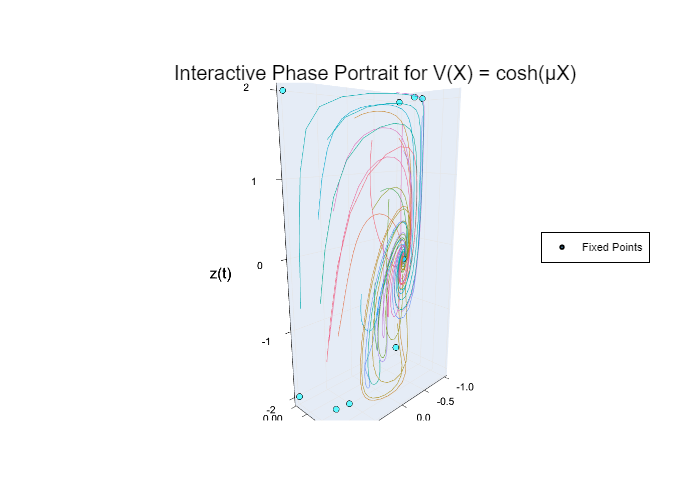

In [43]:
plotlyjs()
Plots.scatter(fixed_points_cosh, shape=:circle, malpha=0.6, msize=1.7, markerstrokewidth=2, markerstrokealpha=1, markerstrokecolor=:black, label="Fixed Points", legend=:right)
Plots.plot!(x_sol_rand_cosh,y_sol_rand_cosh,z_sol_rand_cosh, label="", gridlinewidth=1, cam=(135,15))
Plots.xlabel!("x(t)")
Plots.ylabel!("y(t)")
Plots.zlabel!("z(t)")
Plots.title!("Interactive Phase Portrait for V(X) = cosh(μX)")

Finally, we animate the plot to visualize the overall evolution!

┌ Info: Saved animation to c:\Users\Computing\Documents\PYL800 Proj 4\Hyperbolic Cosine Potential Model.gif
└ @ Plots C:\Users\Computing\.julia\packages\Plots\esM5q\src\animation.jl:156


Plots.AnimatedGif("c:\\Users\\Computing\\Documents\\PYL800 Proj 4\\Hyperbolic Cosine Potential Model.gif")
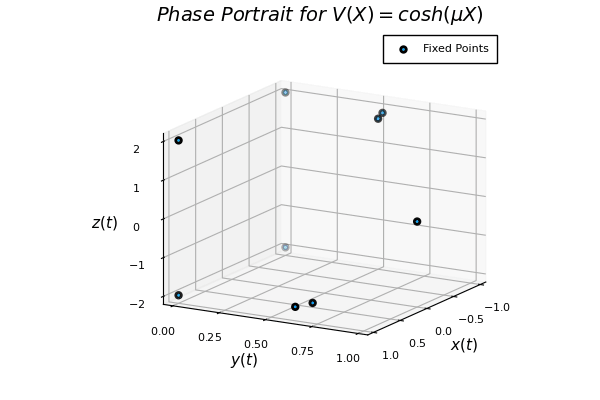

In [44]:
pyplot()
anim = @animate for i ∈ 1:length(x_sol_rand_cosh[1])
    Plots.scatter(fixed_points_cosh, shape=:circle, malpha=0.9, msize=4, markerstrokewidth=2, markerstrokealpha=1, markerstrokecolor=:black, label="Fixed Points")
    for j in 1:length(x_sol_rand_cosh)
        Plots.plot!((x_sol_rand_cosh[j][1:i],y_sol_rand_cosh[j][1:i],z_sol_rand_cosh[j][1:i]), label="", xlabel=L"x(t)",ylabel=L"y(t)",zlabel=L"z(t)",title=L"Phase~Portrait~for~V(X) = cosh(μX)",cam=(120,15),gridlinewidth=2)
    end
end
gif(anim, "Hyperbolic Cosine Potential Model.gif", fps = 12)